# Library loading

In [1]:
import scanpy as sc, anndata as ad, numpy as np, pandas as pd
from scipy import sparse
from anndata import AnnData
import warnings
import socket
import plotly.express as px
import kaleido


from matplotlib import pylab
import sys
import yaml
import os
from pandas.api.types import CategoricalDtype
import plotly
import random


import matplotlib.pyplot as plt

warnings.filterwarnings('ignore')



/group/testa/Users/davide.castaldi/Polaroid_publication_revisions/.local/lib/python3.8/site-packages/setuptools_scm/_integration/setuptools.py:30: RuntimeWarning: 
ERROR: setuptools==56.1.0 is used in combination with setuptools_scm>=8.x

Your build configuration is incomplete and previously worked by accident!
setuptools_scm requires setuptools>=61

Suggested workaround if applicable:
 - migrating from the deprecated setup_requires mechanism to pep517/518
   and using a pyproject.toml to declare build dependencies
   which are reliably pre-installed before running the build tools

  warnings.warn(


In [2]:
plotly.offline.init_notebook_mode()

In [3]:
%matplotlib inline

In [4]:
sc.settings.verbosity = 3         # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=50, facecolor='white')
pylab.rcParams['figure.figsize'] = (9, 9)


scanpy==1.8.0 anndata==0.8.0 umap==0.4.6 numpy==1.22.2 scipy==1.10.1 pandas==1.2.3 scikit-learn==0.24.2 statsmodels==0.13.1 python-igraph==0.9.8 louvain==0.7.1 pynndescent==0.5.5


In [5]:
try:
    nb_fname = ipynbname.name()
except:
    nb_fname = "".join(os.path.basename(globals()["__vsc_ipynb_file__"]).split(".")[:-1])

if not os.path.exists('./tables'):
    os.makedirs('./tables')

### Configure paths

In [6]:
hostRoot = "-".join(socket.gethostname().split('-')[0:2])

 
outdir="./outdir"
adataPath = outdir+"/3_polaroid_quickAnno.h5ad"
figDir = "./figures"

leiden3Mapping = {"0":"EnC1",
"1":"CB/BRC1",
"2":"ExN1",
"3":"EnC2",
"4":"RGC1",
"5":"RGC2",
"6":"cRGC",
"7":"InN",
"8":"ExN2",
"9":"RPC",
"10":"SRC",
"11":"CB/BRC2"}

# Load adata

In [7]:


adata = sc.read_h5ad(adataPath)
adata.obs["leidenAnno"] =  adata.obs["leiden0.3"].replace(leiden3Mapping).astype("category").cat.reorder_categories(list(leiden3Mapping.values()))
adata.uns["leidenAnno_colors"] = adata.uns["leiden0.3_colors"].copy()

In [8]:
adata

AnnData object with n_obs × n_vars = 18822 × 28371
    obs: 'dataset', 'organoid', 'region', 'type', 'type_region', 'regionContrast', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'is.Stressed', 'leiden0.3', 'leidenAnno'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'mean', 'std'
    uns: 'dataset_colors', 'dendrogram_leidenAnno', 'diffmap_evals', 'draw_graph', 'is.Stressed_colors', 'leiden', 'leiden0.3_colors', 'leidenAnno_colors', 'neighbors', 'organoid_colors', 'pca', 'rank_genes_groups', 'regionContrast_colors', 'region_colors', 'type_colors', 'umap'
    obsm: 'X_diffmap', 'X_draw_graph_fa', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

# UMAP

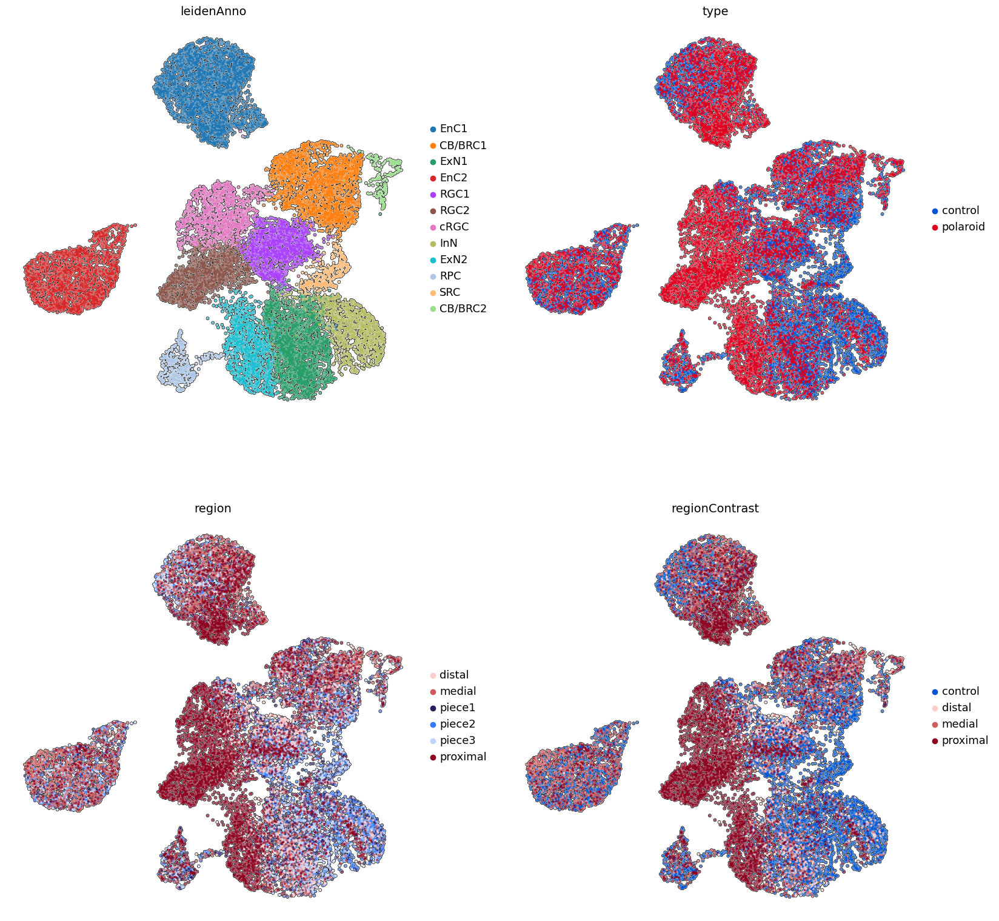

In [9]:
sc.pl.umap(adata, color=["leidenAnno","type","region","regionContrast"], ncols = 2, size = 30, add_outline = True,outline_width=(0.2, 0.05), frameon=False)

In [10]:
# Ordering definition

compositions = pd.DataFrame(adata.obs.groupby(["region","leidenAnno"]).size())
compositions = compositions.reset_index().rename(columns={0:"number_of_cells"})
compositions["number_of_cells_normByregion"] = np.array(compositions["number_of_cells"]) / np.array(compositions.groupby("region")["number_of_cells"].sum()[compositions.region])
compositions["number_of_cells_normByregionANDleidenAnno"] = np.array(compositions["number_of_cells_normByregion"]) / np.array(compositions.groupby("leidenAnno")["number_of_cells_normByregion"].sum()[compositions["leidenAnno"]])



# Controls only

## Region by  leiden

In [11]:
## Not normalized
leidenOrder = ['RGC2',
 'ExN2',
 'cRGC',
 'EnC1',
 'RPC',
 'CB/BRC1',
 'CB/BRC2',
 'RGC1',
 'EnC2',
 'InN',
 'SRC',
 'ExN1']

adata = sc.read_h5ad(adataPath)
adata.obs["leidenAnno"] =  adata.obs["leiden0.3"].replace(leiden3Mapping).astype("category").cat.reorder_categories(list(leiden3Mapping.values()))
adata.uns["leidenAnno_colors"] = adata.uns["leiden0.3_colors"].copy()
adata = adata[adata.obs["type"].isin(["control"])]




variable1="region"
variable2="leidenAnno"





compositions = pd.DataFrame(adata.obs.groupby([variable1,variable2]).size())
compositions = compositions.reset_index().rename(columns={0:"number_of_cells"})
fig = px.bar(compositions, x=variable2, y="number_of_cells", color=variable1, 
             category_orders={variable2:leidenOrder},
              height=800,width=1000, template="plotly_white",
             color_discrete_map = dict(zip(adata.obs[variable1].cat.categories,adata.uns[variable1+"_colors"])),title="## Not normalized",
)



fig.update_traces(marker_line_color='black',
                  marker_line_width=1, opacity=1)
fig.update_layout( yaxis = dict( tickfont = dict(size=30), title_font=dict(size=30)),legend = dict(font = dict(size = 30)), 
                  xaxis = dict( tickfont = dict(size=30), title_font=dict(size=30))
                              )
fig.update_xaxes(tickangle=-45)

fig.write_image(figDir+"/"+nb_fname+"Not_norm.ctlOnly"+".pdf")

fig.show()







## Normalized by region
compositions = pd.DataFrame(adata.obs.groupby([variable1,variable2]).size())
compositions = compositions.reset_index().rename(columns={0:"number_of_cells"})
compositions["number_of_cells_normByregion"] = np.array(compositions["number_of_cells"]) / np.array(compositions.groupby(variable1)["number_of_cells"].sum()[compositions[variable1]])





fig = px.bar(compositions, x=variable2, y="number_of_cells_normByregion", color=variable1, 
              height=800,width=1000, template="plotly_white",
                          category_orders={variable2:leidenOrder},

             color_discrete_map = dict(zip(adata.obs[variable1].cat.categories,adata.uns[variable1+"_colors"])),title="## Normalized by total of each region",
)

fig.update_traces(marker_line_color='black',
                  marker_line_width=1, opacity=1)


fig.update_layout( yaxis = dict( tickfont = dict(size=30), title_font=dict(size=30)),legend = dict(font = dict(size = 30)), 
                  xaxis = dict( tickfont = dict(size=30), title_font=dict(size=30))
                              )
fig.update_xaxes(tickangle=-45)

fig.write_image(figDir+"/"+nb_fname+"Region_Norm.ctlOnly"+".pdf")

fig.show()





## Normalized by region and leiden
compositions = pd.DataFrame(adata.obs.groupby([variable1,variable2]).size())
compositions = compositions.reset_index().rename(columns={0:"number_of_cells"})
compositions["number_of_cells_normByregion"] = np.array(compositions["number_of_cells"]) / np.array(compositions.groupby(variable1)["number_of_cells"].sum()[compositions[variable1]])
compositions["number_of_cells_normByregionANDLeiden"] = np.array(compositions["number_of_cells_normByregion"]) / np.array(compositions.groupby(variable2)["number_of_cells_normByregion"].sum()[compositions[variable2]])




fig = px.bar(compositions, x=variable2, y="number_of_cells_normByregionANDLeiden", color=variable1, 
              height=800,width=1000, template="plotly_white",
                          category_orders={variable2:leidenOrder},

             color_discrete_map = dict(zip(adata.obs[variable1].cat.categories,adata.uns[variable1+"_colors"])),title="## Normalized by total of each region and total of each leiden",
)

fig.update_traces(marker_line_color='black',
                  marker_line_width=1, opacity=1)

fig.update_layout( yaxis = dict( tickfont = dict(size=30), title_font=dict(size=30)),legend = dict(font = dict(size = 30)),
                  xaxis = dict( tickfont = dict(size=30), title_font=dict(size=30))
                              )

fig.update_xaxes(tickangle=-45)



fig.write_image(figDir+"/"+nb_fname+"Leiden_Region_Norm.ctlOnly"+".pdf")
compositions.to_excel("./tables/ExtendedFig8Ccontrols.xlsx")

fig.show()

## Leiden fraction by region

In [12]:
# As fraction of segment



adata = sc.read_h5ad(adataPath)
adata.obs["leidenAnno"] =  adata.obs["leiden0.3"].replace(leiden3Mapping).astype("category").cat.reorder_categories(list(leiden3Mapping.values()))
adata.uns["leidenAnno_colors"] = adata.uns["leiden0.3_colors"].copy()
adata = adata[adata.obs["type"].isin(["control"])]



variable1="region"
variable2="leidenAnno"



## Expressed as fraction
compositions = pd.DataFrame(adata.obs.groupby([variable1,variable2]).size())
compositions = compositions.reset_index().rename(columns={0:"number_of_cells"})
compositions["Fraction of cells"] = np.array(compositions["number_of_cells"]) / np.array(compositions.groupby(variable1)["number_of_cells"].sum()[compositions[variable1]])




fig = px.bar(compositions, x=variable1, y="Fraction of cells", color=variable2, 
              height=800,width=700, template="plotly_white",
                          category_orders={variable2:["cRGC","RGC1","RGC2","ExN1","ExN2","InN","CB/BRC1","CB/BRC2","EnC1","EnC2","SRC","RPC"],
                                           variable1:["piece1","piece2","piece3"]},

             color_discrete_map = dict(zip(adata.obs[variable2].cat.categories,adata.uns[variable2+"_colors"])),title="Fraction of cells per cluster",
)
fig.update_traces(marker_line_color='black',
                  marker_line_width=.6, opacity=1)
fig.update_layout( yaxis = dict( tickfont = dict(size=30), title_font=dict(size=30)),legend = dict(font = dict(size = 30)), 
                  xaxis = dict( tickfont = dict(size=30), title_font=dict(size=30))
                              )
fig.update_xaxes(tickangle=-45)
fig.write_image(figDir+"/"+nb_fname+"Leidenfractions.ctlOnly"+".svg")
compositions.to_excel("./tables/MainFig5D.controls.xlsx")


fig.show()








# Polaroids only

## Region by  leiden

In [13]:
## Not normalized
adata = sc.read_h5ad(adataPath)
adata.obs["leidenAnno"] =  adata.obs["leiden0.3"].replace(leiden3Mapping).astype("category").cat.reorder_categories(list(leiden3Mapping.values()))
adata.uns["leidenAnno_colors"] = adata.uns["leiden0.3_colors"].copy()
adata = adata[adata.obs["type"].isin(["polaroid"])]




variable1="region"
variable2="leidenAnno"





compositions = pd.DataFrame(adata.obs.groupby([variable1,variable2]).size())
compositions = compositions.reset_index().rename(columns={0:"number_of_cells"})
fig = px.bar(compositions, x=variable2, y="number_of_cells", color=variable1, 
             category_orders={variable2:leidenOrder},
              height=800,width=1000, template="plotly_white",
             color_discrete_map = dict(zip(adata.obs[variable1].cat.categories,adata.uns[variable1+"_colors"])),title="## Not normalized",
)



fig.update_traces(marker_line_color='black',
                  marker_line_width=1, opacity=1)
fig.update_layout( yaxis = dict( tickfont = dict(size=30), title_font=dict(size=30)),legend = dict(font = dict(size = 30)), 
                  xaxis = dict( tickfont = dict(size=30), title_font=dict(size=30))
                              )
fig.update_xaxes(tickangle=-45)

fig.write_image(figDir+"/"+nb_fname+"Not_norm.ctlOnly"+".pdf")

fig.show()







## Normalized by region
compositions = pd.DataFrame(adata.obs.groupby([variable1,variable2]).size())
compositions = compositions.reset_index().rename(columns={0:"number_of_cells"})
compositions["number_of_cells_normByregion"] = np.array(compositions["number_of_cells"]) / np.array(compositions.groupby(variable1)["number_of_cells"].sum()[compositions[variable1]])





fig = px.bar(compositions, x=variable2, y="number_of_cells_normByregion", color=variable1, 
              height=800,width=1000, template="plotly_white",
                          category_orders={variable2:leidenOrder},

             color_discrete_map = dict(zip(adata.obs[variable1].cat.categories,adata.uns[variable1+"_colors"])),title="## Normalized by total of each region",
)

fig.update_traces(marker_line_color='black',
                  marker_line_width=1, opacity=1)


fig.update_layout( yaxis = dict( tickfont = dict(size=30), title_font=dict(size=30)),legend = dict(font = dict(size = 30)), 
                  xaxis = dict( tickfont = dict(size=30), title_font=dict(size=30))
                              )
fig.update_xaxes(tickangle=-45)

fig.write_image(figDir+"/"+nb_fname+"Region_Norm.ctlOnly"+".pdf")

fig.show()





## Normalized by region and leiden
compositions = pd.DataFrame(adata.obs.groupby([variable1,variable2]).size())
compositions = compositions.reset_index().rename(columns={0:"number_of_cells"})
compositions["number_of_cells_normByregion"] = np.array(compositions["number_of_cells"]) / np.array(compositions.groupby(variable1)["number_of_cells"].sum()[compositions[variable1]])
compositions["number_of_cells_normByregionANDLeiden"] = np.array(compositions["number_of_cells_normByregion"]) / np.array(compositions.groupby(variable2)["number_of_cells_normByregion"].sum()[compositions[variable2]])




fig = px.bar(compositions, x=variable2, y="number_of_cells_normByregionANDLeiden", color=variable1, 
              height=800,width=1000, template="plotly_white",
                          category_orders={variable2:leidenOrder},

             color_discrete_map = dict(zip(adata.obs[variable1].cat.categories,adata.uns[variable1+"_colors"])),title="## Normalized by total of each region and total of each leiden",
)

fig.update_traces(marker_line_color='black',
                  marker_line_width=1, opacity=1)

fig.update_layout( yaxis = dict( tickfont = dict(size=30), title_font=dict(size=30)),legend = dict(font = dict(size = 30)),
                  xaxis = dict( tickfont = dict(size=30), title_font=dict(size=30))
                              )

fig.update_xaxes(tickangle=-45)



fig.write_image(figDir+"/"+nb_fname+"Leiden_Region_Norm.polcasonly"+".pdf")
compositions.to_excel("./tables/ExtendedFig8Cpolcas.xlsx")

fig.show()

## Leiden fraction by region

In [14]:
# As fraction of segment



# As fraction of segment

adata = sc.read_h5ad(adataPath)
adata.obs["leidenAnno"] =  adata.obs["leiden0.3"].replace(leiden3Mapping).astype("category").cat.reorder_categories(list(leiden3Mapping.values()))
adata.uns["leidenAnno_colors"] = adata.uns["leiden0.3_colors"].copy()
adata = adata[adata.obs["type"].isin(["polaroid"])]


variable1="region"
variable2="leidenAnno"



## Expressed as fraction
compositions = pd.DataFrame(adata.obs.groupby([variable1,variable2]).size())
compositions = compositions.reset_index().rename(columns={0:"number_of_cells"})
compositions["Fraction of cells"] = np.array(compositions["number_of_cells"]) / np.array(compositions.groupby(variable1)["number_of_cells"].sum()[compositions[variable1]])




fig = px.bar(compositions, x=variable1, y="Fraction of cells", color=variable2, 
              height=800,width=700, template="plotly_white",
                          category_orders={variable2:["cRGC","RGC1","RGC2","ExN1","ExN2","InN","CB/BRC1","CB/BRC2","EnC1","EnC2","SRC","RPC"],
                                           variable1:["proximal","medial","distal"]},

             color_discrete_map = dict(zip(adata.obs[variable2].cat.categories,adata.uns[variable2+"_colors"])),title="Fraction of cells per cluster",
)

fig.update_traces(marker_line_color='black',
                  marker_line_width=.6, opacity=1)
fig.update_layout( yaxis = dict( tickfont = dict(size=30), title_font=dict(size=30)),legend = dict(font = dict(size = 30)), 
                  xaxis = dict( tickfont = dict(size=30), title_font=dict(size=30))
                              )
fig.update_xaxes(tickangle=-45)
fig.write_image(figDir+"/"+nb_fname+"Leidenfractions.polaroidOnly"+".svg")
compositions.to_excel("./tables/MainFig5D.polCAs.xlsx")


fig.show()






# Polaroids and control

## Region by  leiden

In [15]:
## Not normalized
adata = sc.read_h5ad(adataPath)
adata.obs["leidenAnno"] =  adata.obs["leiden0.3"].replace(leiden3Mapping).astype("category").cat.reorder_categories(list(leiden3Mapping.values()))
adata.uns["leidenAnno_colors"] = adata.uns["leiden0.3_colors"].copy()
#adata = adata[adata.obs["type"].isin(["polaroid"])]


variable1="region"
variable2="leidenAnno"

regionOrder=["proximal","medial","distal","piece1","piece2","piece3"]




compositions = pd.DataFrame(adata.obs.groupby([variable1,variable2]).size())
compositions = compositions.reset_index().rename(columns={0:"number_of_cells"})
fig = px.bar(compositions, x=variable2, y="number_of_cells", color=variable1, 
             category_orders={variable2:leidenOrder,variable1:regionOrder},
              height=800,width=1000, template="plotly_white",
             color_discrete_map = dict(zip(adata.obs[variable1].cat.categories,adata.uns[variable1+"_colors"])),title="## Not normalized",
)

fig.update_traces(marker_line_color='black',
                  marker_line_width=1, opacity=1)
fig.update_layout( yaxis = dict( tickfont = dict(size=30), title_font=dict(size=30)),legend = dict(font = dict(size = 30)), 
                  xaxis = dict( tickfont = dict(size=30), title_font=dict(size=30))
                              )
fig.update_xaxes(tickangle=-45)



#fig.write_image(figDir+"/"+outBaseName+"Not_norm.polaroidOnly"+".pdf")


fig.show()

## Normalized by region
compositions = pd.DataFrame(adata.obs.groupby([variable1,variable2]).size())
compositions = compositions.reset_index().rename(columns={0:"number_of_cells"})
compositions["number_of_cells_normByregion"] = np.array(compositions["number_of_cells"]) / np.array(compositions.groupby(variable1)["number_of_cells"].sum()[compositions[variable1]])




fig = px.bar(compositions, x=variable2, y="number_of_cells_normByregion", color=variable1, 
              height=800,width=1000, template="plotly_white",
             category_orders={variable2:leidenOrder,variable1:regionOrder},

             color_discrete_map = dict(zip(adata.obs[variable1].cat.categories,adata.uns[variable1+"_colors"])),title="## Normalized by total of each region",
)

fig.update_traces(marker_line_color='black',
                  marker_line_width=1, opacity=1)
fig.update_layout( yaxis = dict( tickfont = dict(size=30), title_font=dict(size=30)),legend = dict(font = dict(size = 30)), 
                  xaxis = dict( tickfont = dict(size=30), title_font=dict(size=30))
                        )

fig.update_xaxes(tickangle=-45)

#fig.write_image(figDir+"/"+outBaseName+"Region_Norm.polaroidOnly"+".pdf")


fig.show()





## Normalized by region and leiden
compositions = pd.DataFrame(adata.obs.groupby([variable1,variable2]).size())
compositions = compositions.reset_index().rename(columns={0:"number_of_cells"})
compositions["number_of_cells_normByregion"] = np.array(compositions["number_of_cells"]) / np.array(compositions.groupby(variable1)["number_of_cells"].sum()[compositions[variable1]])
compositions["number_of_cells_normByregionANDLeiden"] = np.array(compositions["number_of_cells_normByregion"]) / np.array(compositions.groupby(variable2)["number_of_cells_normByregion"].sum()[compositions[variable2]])



fig = px.bar(compositions, x=variable2, y="number_of_cells_normByregionANDLeiden", color=variable1, 
              height=800,width=1000, template="plotly_white",
             category_orders={variable2:leidenOrder,variable1:regionOrder},

             color_discrete_map = dict(zip(adata.obs[variable1].cat.categories,adata.uns[variable1+"_colors"])),title="## Normalized by total of each region and total of each leiden",
)

fig.update_traces(marker_line_color='black',
                  marker_line_width=1, opacity=1)
fig.update_layout( yaxis = dict( tickfont = dict(size=30), title_font=dict(size=30)),legend = dict(font = dict(size = 30)), 
                  xaxis = dict( tickfont = dict(size=30), title_font=dict(size=30))
                              )
fig.update_xaxes(tickangle=-45)

fig.write_image(figDir+"/"+nb_fname+"Leiden_Region_Norm.AllByRegion."+".pdf")
compositions.to_excel("./tables/MainFig5F.xlsx")


fig.show()

# polaroids vs controls

## Region by  leiden

In [16]:


## Not normalized
variable1="type"
variable2="leidenAnno"

adata = sc.read_h5ad(adataPath)
adata.obs["leidenAnno"] =  adata.obs["leiden0.3"].replace(leiden3Mapping).astype("category").cat.reorder_categories(list(leiden3Mapping.values()))
adata.uns["leidenAnno_colors"] = adata.uns["leiden0.3_colors"].copy()

compositions = pd.DataFrame(adata.obs.groupby([variable1,variable2]).size())
compositions = compositions.reset_index().rename(columns={0:"number_of_cells"})
compositions["number_of_cells_normByregion"] = np.array(compositions["number_of_cells"]) / np.array(compositions.groupby(variable1)["number_of_cells"].sum()[compositions[variable1]])
compositions["number_of_cells_normByregionANDleidenAnno"] = np.array(compositions["number_of_cells_normByregion"]) / np.array(compositions.groupby(variable2)["number_of_cells_normByregion"].sum()[compositions[variable2]])

#leidenOrder = compositions[compositions[variable1] == "polaroid"].sort_values("number_of_cells_normByregionANDleidenAnno", ascending=False)[variable2].tolist()
leidenOrder













compositions = pd.DataFrame(adata.obs.groupby([variable1,variable2]).size())
compositions = compositions.reset_index().rename(columns={0:"number_of_cells"})
fig = px.bar(compositions, x=variable2, y="number_of_cells", color=variable1, 
             category_orders={variable2:leidenOrder},
              height=800,width=1000, template="plotly_white",
             color_discrete_map = dict(zip(adata.obs[variable1].cat.categories,adata.uns[variable1+"_colors"])),title="## Not normalized",
)

fig.update_traces(marker_line_color='black',
                  marker_line_width=1, opacity=1)
fig.update_layout( yaxis = dict( tickfont = dict(size=30), title_font=dict(size=30)),legend = dict(font = dict(size = 30)), 
                  xaxis = dict( tickfont = dict(size=30), title_font=dict(size=30))
                              )
fig.update_xaxes(tickangle=-45)


fig.write_image(figDir+"/"+nb_fname+"not_Norm.both"+".pdf")

fig.show()







## Normalized by region
compositions = pd.DataFrame(adata.obs.groupby([variable1,variable2]).size())
compositions = compositions.reset_index().rename(columns={0:"number_of_cells"})
compositions["number_of_cells_normByregion"] = np.array(compositions["number_of_cells"]) / np.array(compositions.groupby(variable1)["number_of_cells"].sum()[compositions[variable1]])




fig = px.bar(compositions, x=variable2, y="number_of_cells_normByregion", color=variable1, 
              height=800,width=1000, template="plotly_white",
                          category_orders={variable2:leidenOrder},

             color_discrete_map = dict(zip(adata.obs[variable1].cat.categories,adata.uns[variable1+"_colors"])),title="## Normalized by total of each region",
)

fig.update_traces(marker_line_color='black',
                  marker_line_width=1, opacity=1)
fig.update_layout( yaxis = dict( tickfont = dict(size=30), title_font=dict(size=30)),legend = dict(font = dict(size = 30)), 
                  xaxis = dict( tickfont = dict(size=30), title_font=dict(size=30))
                              )
fig.update_xaxes(tickangle=-45)


fig.write_image(figDir+"/"+nb_fname+"Region_Norm.both"+".pdf")

fig.show()





## Normalized by region and leiden
compositions = pd.DataFrame(adata.obs.groupby([variable1,variable2]).size())
compositions = compositions.reset_index().rename(columns={0:"number_of_cells"})
compositions["number_of_cells_normByregion"] = np.array(compositions["number_of_cells"]) / np.array(compositions.groupby(variable1)["number_of_cells"].sum()[compositions[variable1]])
compositions["number_of_cells_normByregionANDLeiden"] = np.array(compositions["number_of_cells_normByregion"]) / np.array(compositions.groupby(variable2)["number_of_cells_normByregion"].sum()[compositions[variable2]])



fig = px.bar(compositions, x=variable2, y="number_of_cells_normByregionANDLeiden", color=variable1, 
              height=800,width=1000, template="plotly_white",
                          category_orders={variable2:leidenOrder},

             color_discrete_map = dict(zip(adata.obs[variable1].cat.categories,adata.uns[variable1+"_colors"])),title="## Normalized by total of each region and total of each leiden",
)

fig.update_traces(marker_line_color='black',
                  marker_line_width=1, opacity=1)

fig.update_layout( yaxis = dict( tickfont = dict(size=30), title_font=dict(size=30)),legend = dict(font = dict(size = 30)), 
                  xaxis = dict( tickfont = dict(size=30), title_font=dict(size=30))
                              )

fig.update_xaxes(tickangle=-45)


                                
fig.write_image(figDir+"/"+nb_fname+"Leiden_Region_Norm.both"+".pdf", scale=3)
compositions.to_excel("./tables/ExtendedFig8B.xlsx")


fig.show()

# UMAPs by organoid

In [17]:
adata = sc.read_h5ad(adataPath)
adata.obs["leidenAnno"] =  adata.obs["leiden0.3"].replace(leiden3Mapping).astype("category").cat.reorder_categories(list(leiden3Mapping.values()))
adata.uns["leidenAnno_colors"] = adata.uns["leiden0.3_colors"].copy()

Plot for organoid control3
Plot for organoid control3


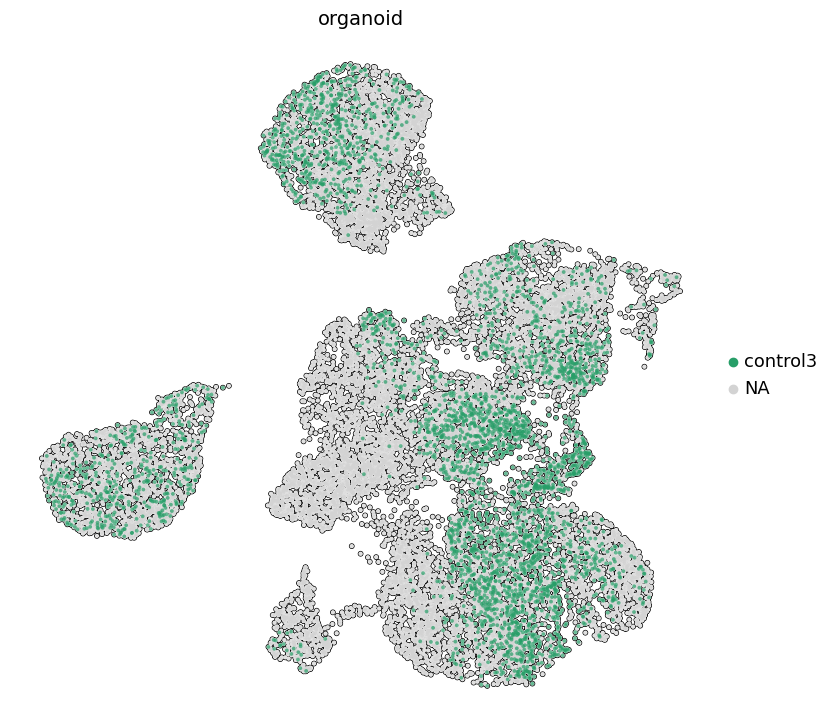

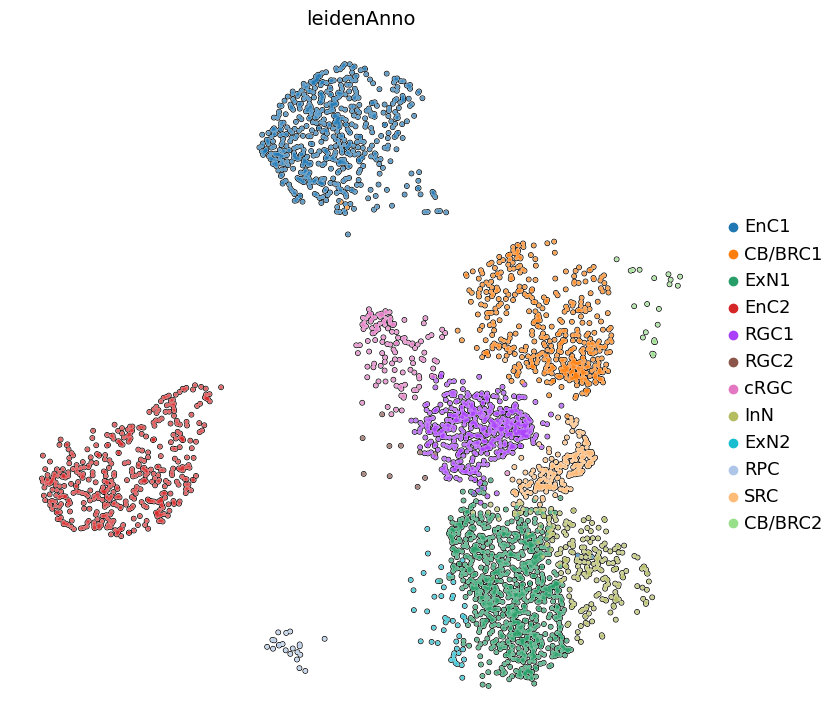

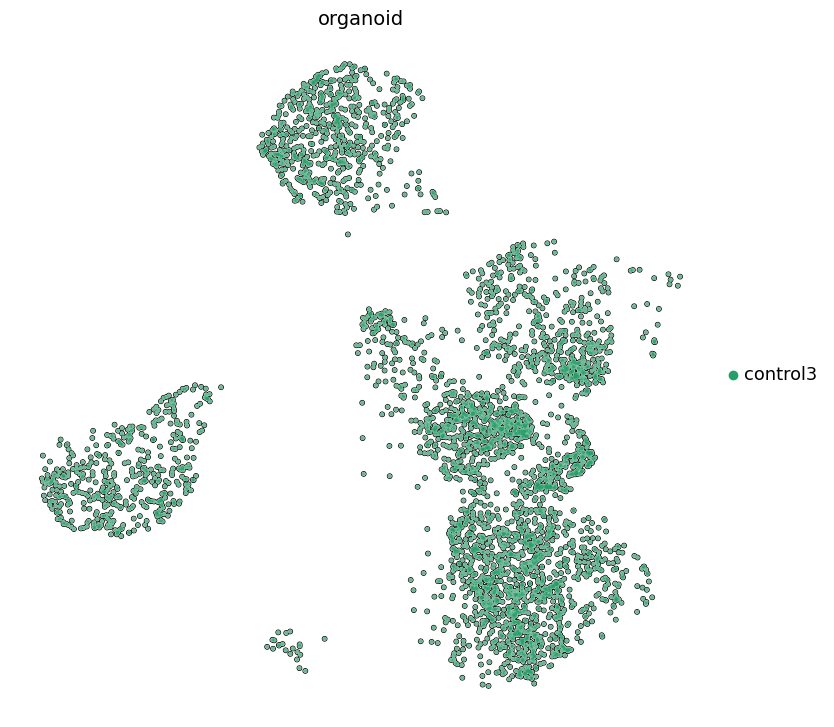

Plot for organoid control1
Plot for organoid control1


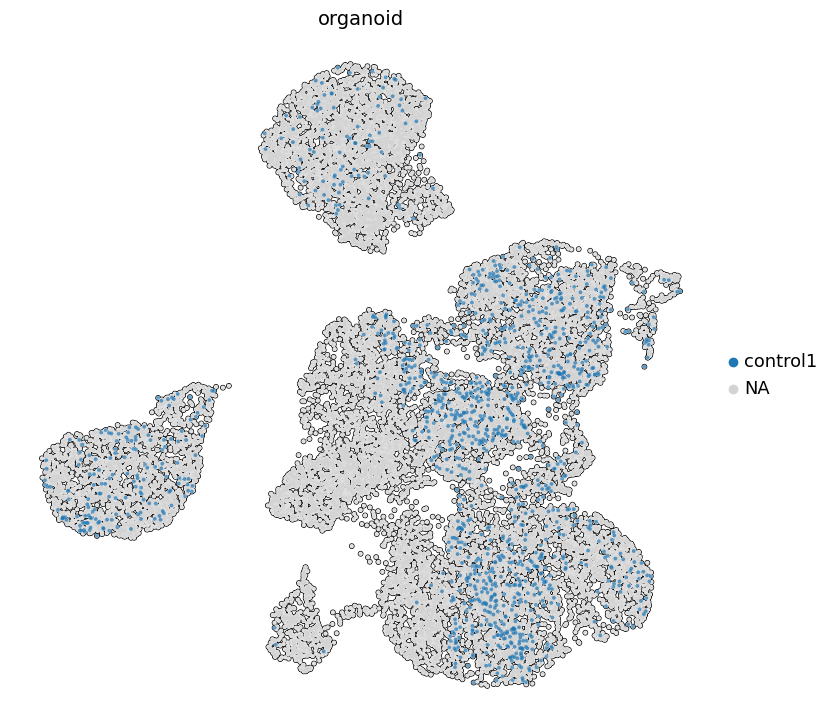

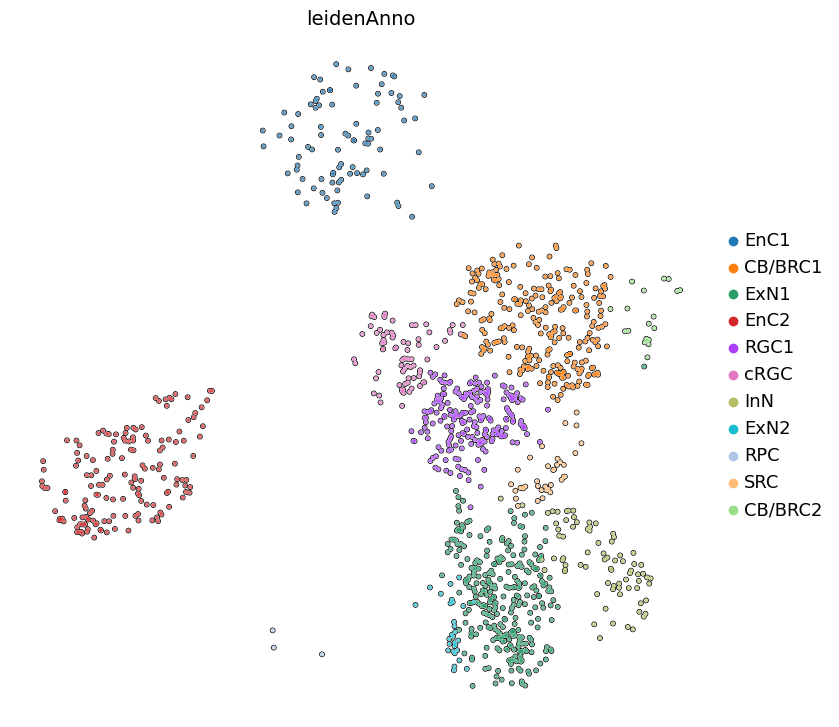

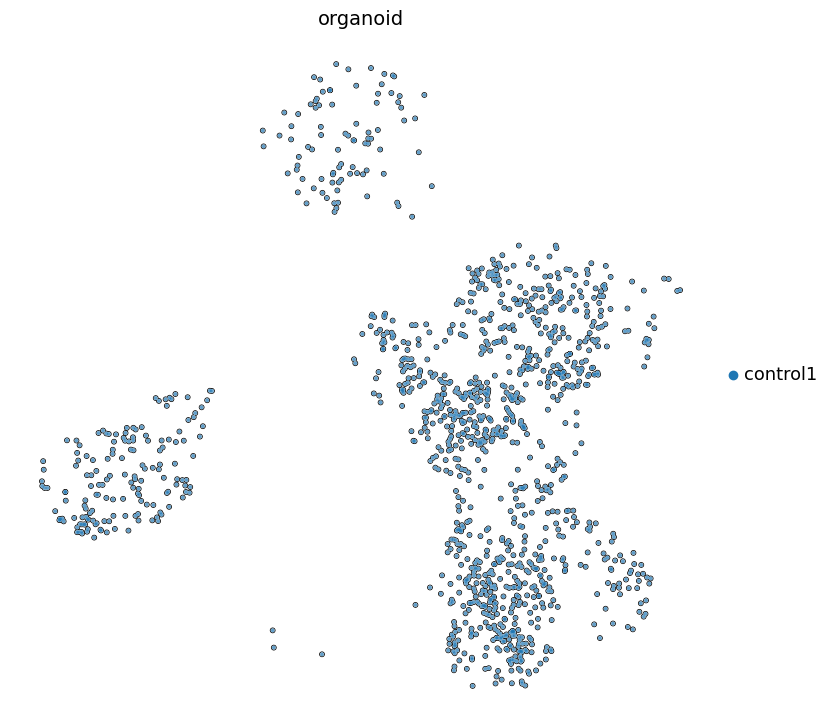

Plot for organoid control2
Plot for organoid control2


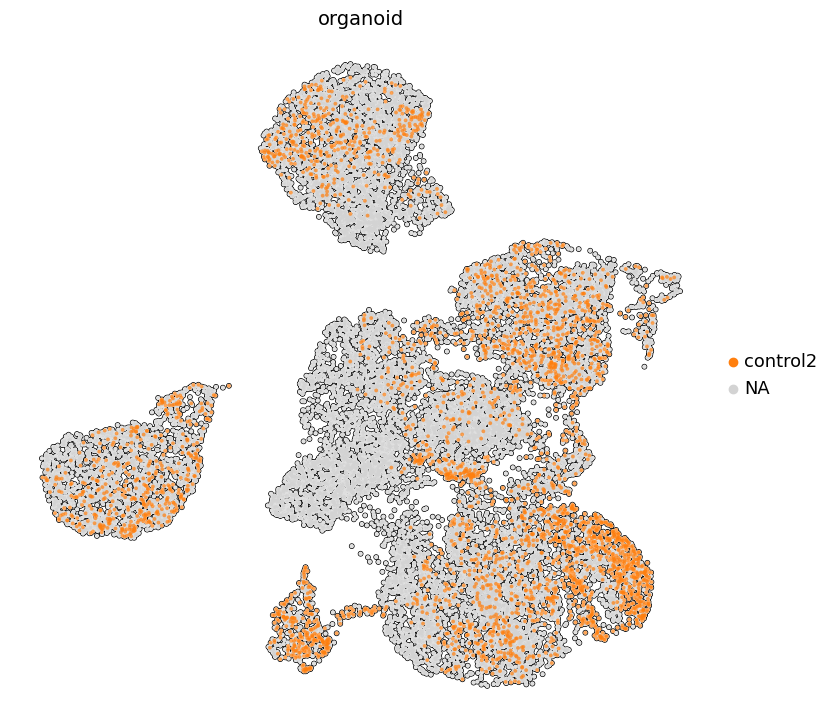

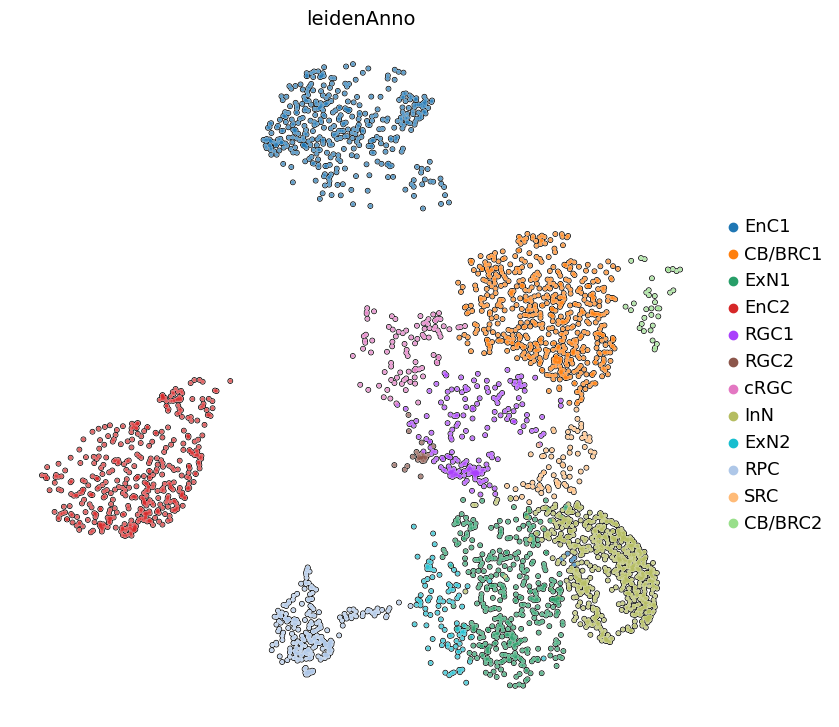

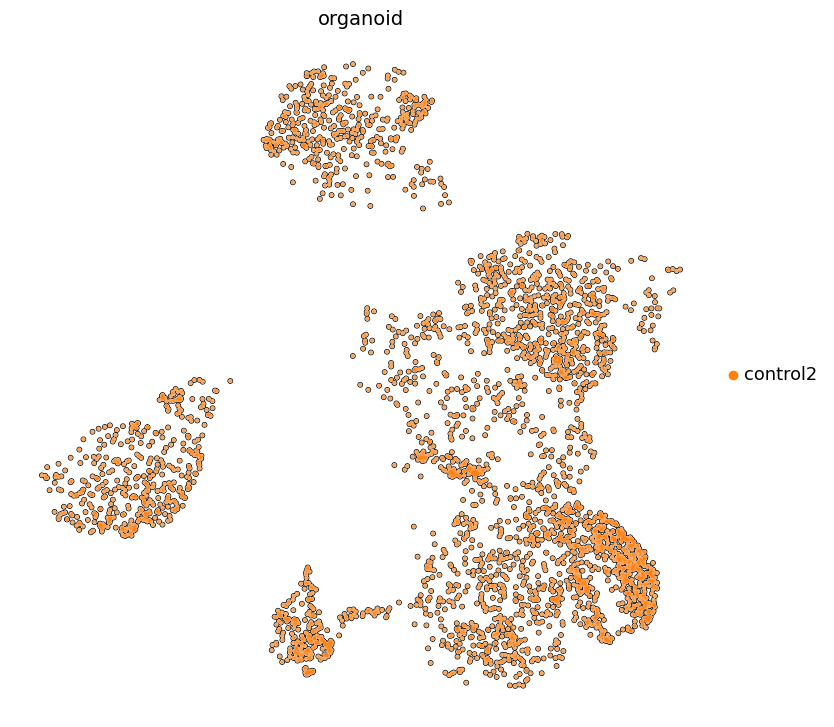

Plot for organoid polaroid3
Plot for organoid polaroid3


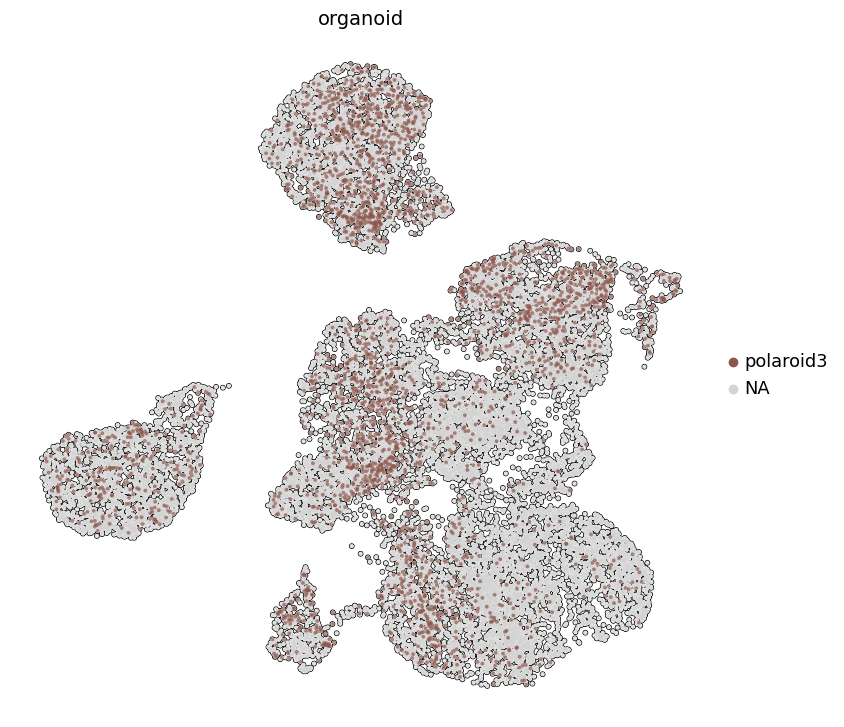

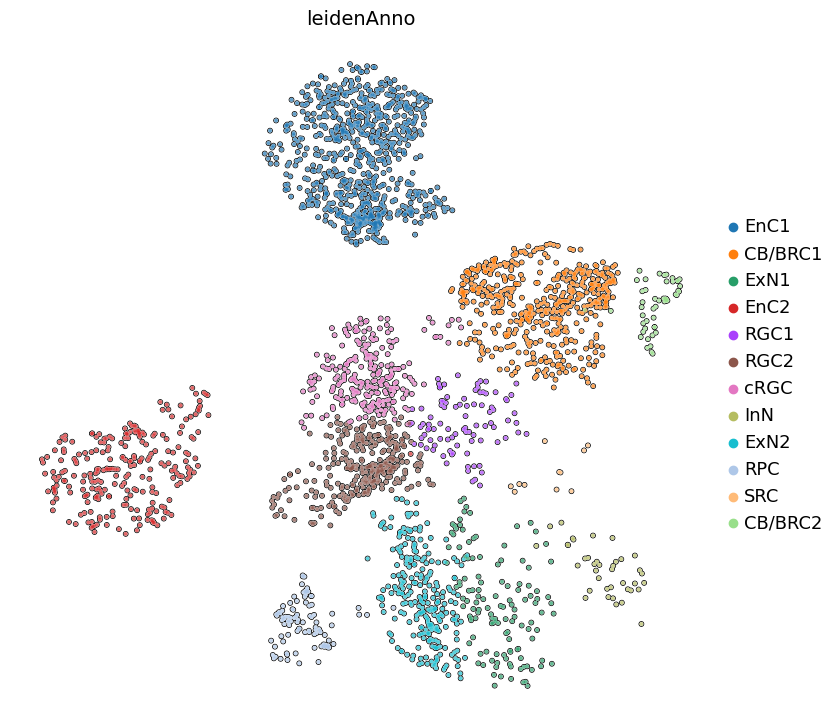

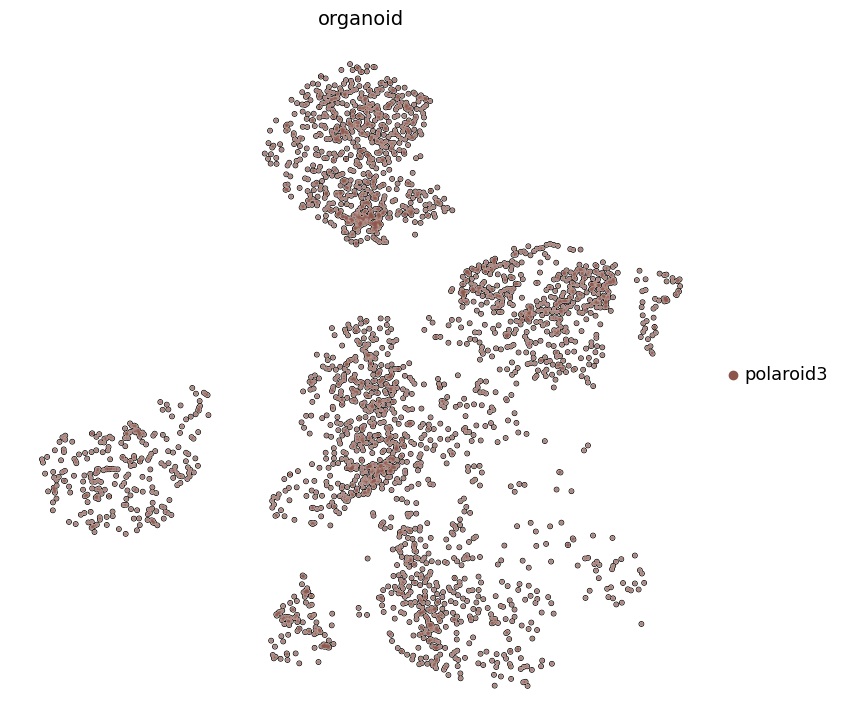

Plot for organoid polaroid2
Plot for organoid polaroid2


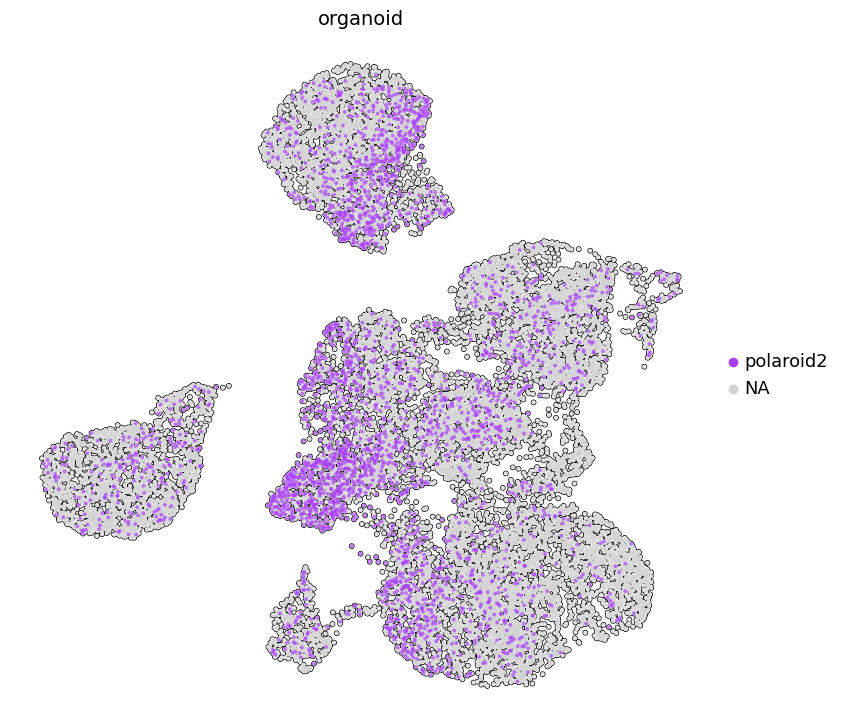

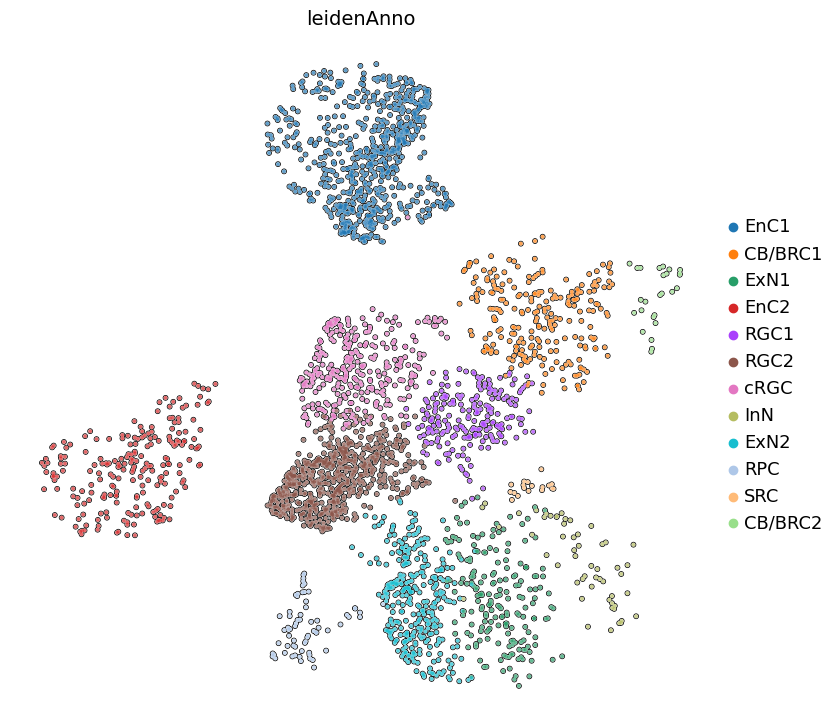

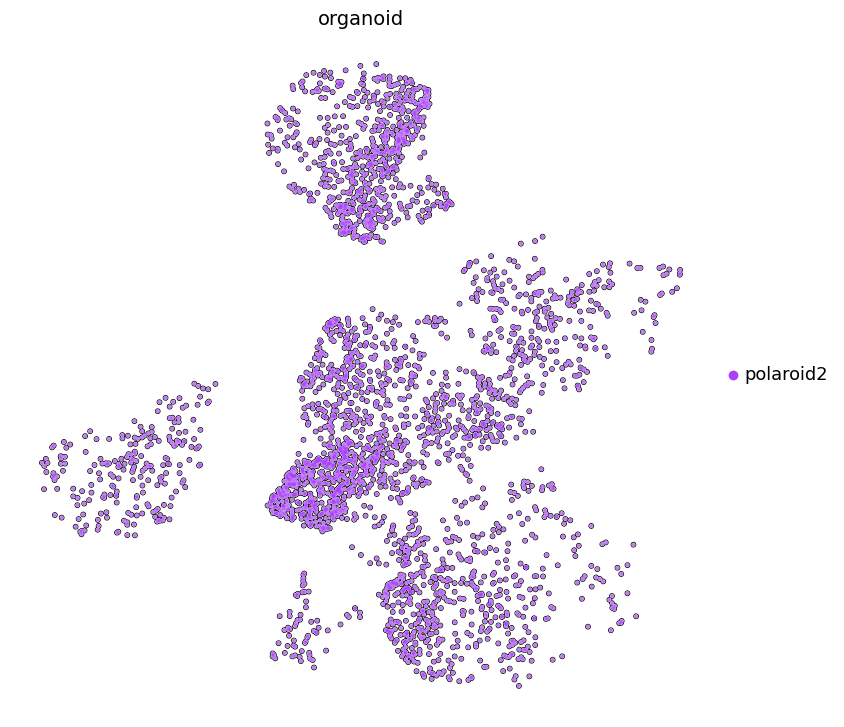

Plot for organoid polaroid1
Plot for organoid polaroid1


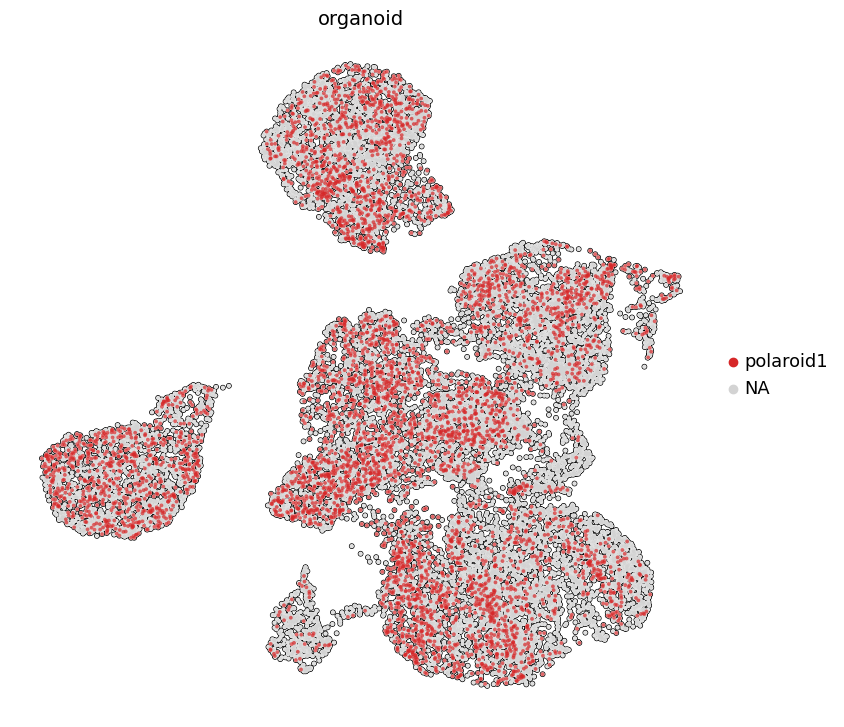

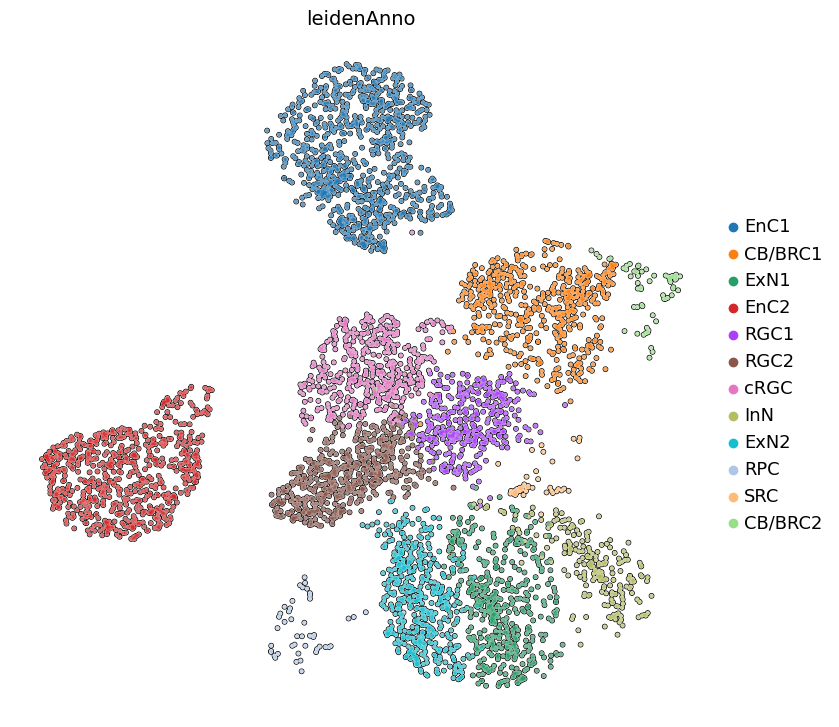

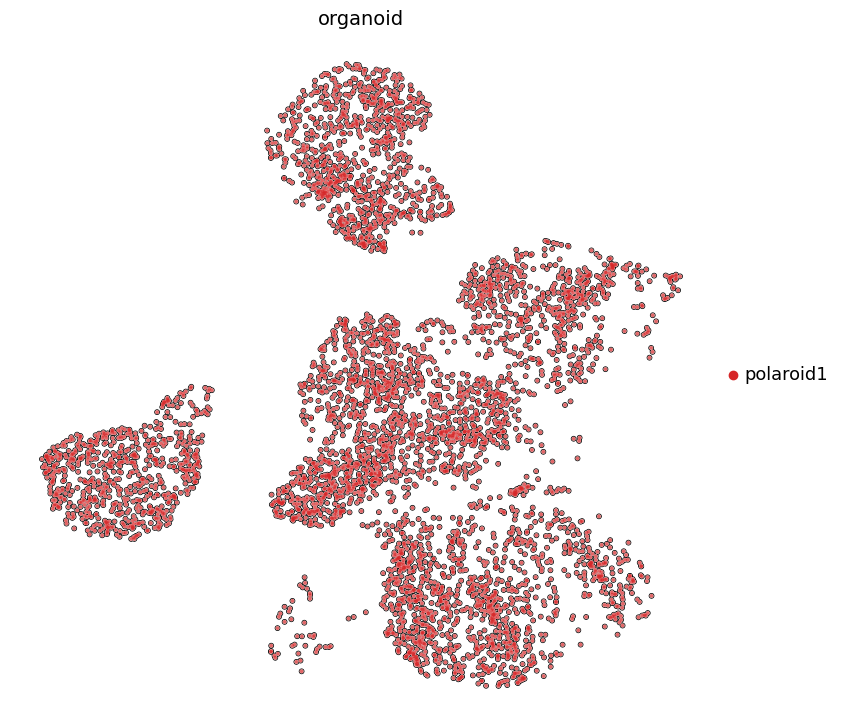

In [18]:
for org in adata.obs.organoid.unique() :
    print("Plot for organoid {}".format(org))
    print("Plot for organoid {}".format(org))

    sc.pl.umap(adata, color=["organoid"],groups= org, size = 30, add_outline = True,outline_width=(0.2, 0.05), frameon=False)
    adataSS = adata[adata.obs.organoid==org]
    sc.pl.umap(adataSS, color=["leidenAnno"], size = 30, add_outline = True,outline_width=(0.2, 0.05), frameon=False)
    sc.pl.umap(adataSS, color=["organoid"], size = 30, add_outline = True,outline_width=(0.2, 0.05), frameon=False)



# SP8/EMX1 positive cells

In [19]:
markersDblPositive = ("SP8","EMX1")
adata = sc.read_h5ad(adataPath)
adata.obs["leidenAnno"] =  adata.obs["leiden0.3"].replace(leiden3Mapping).astype("category").cat.reorder_categories(list(leiden3Mapping.values()))
adata.uns["leidenAnno_colors"] = adata.uns["leiden0.3_colors"].copy()
adata.obs["{}-{}+".format(markersDblPositive[0],markersDblPositive[1])] = np.nan
adata.obs.loc[((adata.raw.to_adata()[:,markersDblPositive[0]].X.todense().A1 > 0 ) & (adata.raw.to_adata()[:,markersDblPositive[1]].X.todense().A1 > 0 )),"{}-{}+".format(markersDblPositive[0],markersDblPositive[1])] = "{}-{}+".format(markersDblPositive[0],markersDblPositive[1])

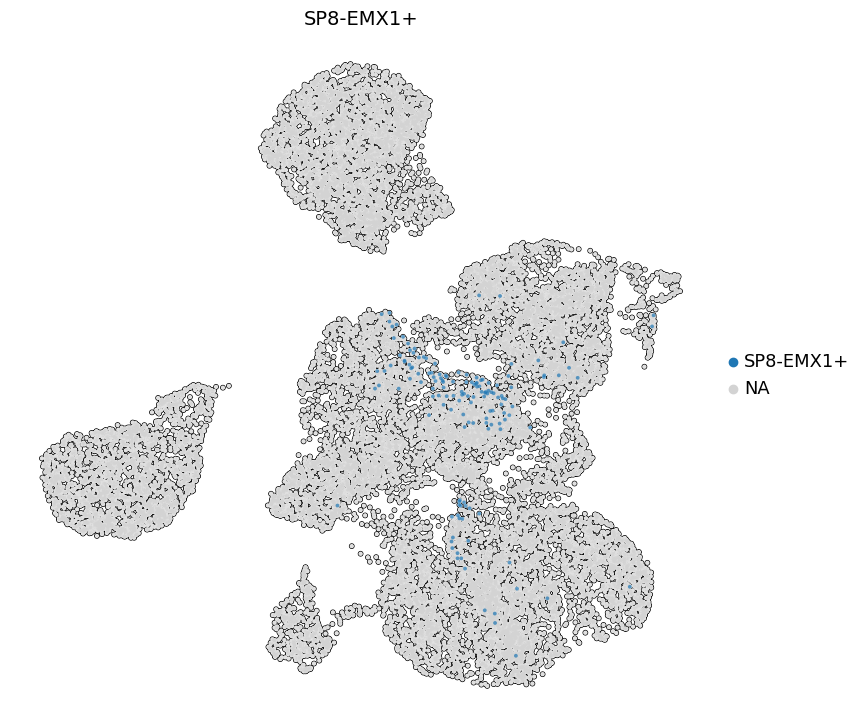

In [20]:
sc.pl.umap(adata, color=["{}-{}+".format(markersDblPositive[0],markersDblPositive[1])], ncols = 2, size = 30, add_outline = True,outline_width=(0.2, 0.05), frameon=False)

In [21]:
with open("./colorMap.yaml", 'r') as f:
    colorMap = yaml.load(f, Loader=yaml.FullLoader)["uns_colors"]
    
catOrder = ["piece1","piece2","piece3","distal","medial","proximal"]

In [22]:
# import holoviews as hv
# obsTupleToMap = ("region","{}-{}+".format(markersDblPositive[0],markersDblPositive[1]))
# SankeyDF=adata.obs[list(obsTupleToMap)]
# SankeyDF.columns = [obsTupleToMap[0],obsTupleToMap[1]]
# SankeyDF = SankeyDF.groupby([obsTupleToMap[0],obsTupleToMap[1]]).size().reset_index().rename(columns={0:'count'})
# SankeyDF=SankeyDF[SankeyDF["count"] != 0]
# hv.extension('bokeh')

# print(adata.obs[obsTupleToMap[0]].value_counts())
# print(pd.crosstab(adata.obs[obsTupleToMap[0]],adata.obs[obsTupleToMap[1]]))

# SankeyDF.region = SankeyDF.region.cat.set_categories(catOrder)
# SankeyDF = SankeyDF.sort_values(["region"])

# sankey1 = hv.Sankey(SankeyDF, kdims=[obsTupleToMap[0],obsTupleToMap[1]], vdims="count")

# colorDict =dict(zip(adata.obs[obsTupleToMap[0]].unique().tolist(),[colorMap[i]["color"] for i in adata.obs[obsTupleToMap[0]].unique().tolist()]))

# sankey1.opts(cmap=colorDict,label_position='outer',
# edge_color=obsTupleToMap[0], edge_line_width=0,
# node_alpha=1.0, node_width=40, node_sort=False,
# width=1100, height=700, bgcolor="white")


In [23]:
markersDblPositive[1]

'EMX1'

In [24]:
variable1="region"
variable2="{}-{}+".format(markersDblPositive[0],markersDblPositive[1])
#variable2="SP8-EMX1+"




compositions = pd.DataFrame(adata.obs.groupby([variable1,variable2]).size())
compositions = compositions.reset_index().rename(columns={0:"number_of_cells"})
compositions["number_of_cells_normBy"+variable1] = (np.array(compositions["number_of_cells"]) / adata.obs[variable1].value_counts().loc[compositions[variable1]]).tolist()


print(compositions)

fig = px.bar(compositions, x=variable2, y="number_of_cells_normBy"+variable1, color=variable1, 
              height=800,width=1000, template="plotly_white",
                          category_orders={variable1:catOrder},

             color_discrete_map = dict(zip(adata.obs[variable1].cat.categories,adata.uns[variable1+"_colors"]))
)

fig.update_traces(marker_line_color='black',
                  marker_line_width=1, opacity=1)

fig.update_layout( yaxis = dict( tickfont = dict(size=30), title_font=dict(size=30)),legend = dict(font = dict(size = 30)),
                  xaxis = dict( tickfont = dict(size=30), title_font=dict(size=30))
                              )




fig.write_image(figDir+"/"+nb_fname+"Leiden_Region_Norm.{}-{}+".format(markersDblPositive[0],markersDblPositive[1])+".pdf")

fig.show()

     region  SP8-EMX1+  number_of_cells  number_of_cells_normByregion
0    distal  SP8-EMX1+               43                      0.028364
1    medial  SP8-EMX1+               13                      0.004306
2    piece1  SP8-EMX1+               33                      0.013842
3    piece2  SP8-EMX1+               19                      0.006570
4    piece3  SP8-EMX1+               12                      0.004112
5  proximal  SP8-EMX1+               24                      0.003939


# SATB2 /BCL11B  positive cells

In [25]:
markersDblPositive = ("SATB2","BCL11B")
adata = sc.read_h5ad(adataPath)
adata.obs["leidenAnno"] =  adata.obs["leiden0.3"].replace(leiden3Mapping).astype("category").cat.reorder_categories(list(leiden3Mapping.values()))
adata.uns["leidenAnno_colors"] = adata.uns["leiden0.3_colors"].copy()
adata.obs["{}-{}+".format(markersDblPositive[0],markersDblPositive[1])] = np.nan
adata.obs.loc[((adata.raw.to_adata()[:,markersDblPositive[0]].X.todense().A1 > 0 ) & (adata.raw.to_adata()[:,markersDblPositive[1]].X.todense().A1 > 0 )),"{}-{}+".format(markersDblPositive[0],markersDblPositive[1])] = "{}-{}+".format(markersDblPositive[0],markersDblPositive[1])

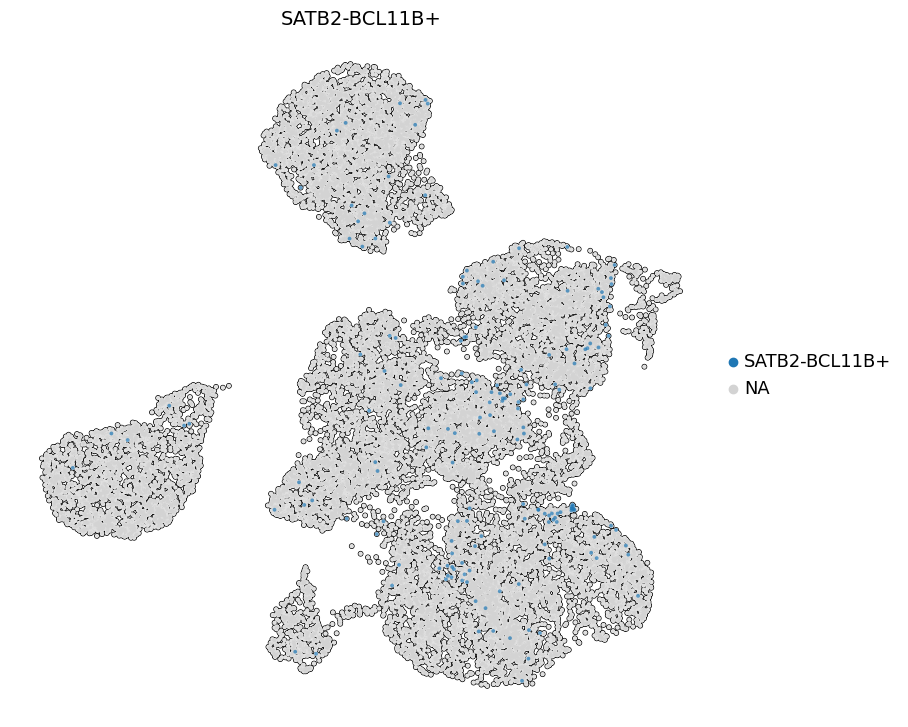

In [26]:
sc.pl.umap(adata, color=["{}-{}+".format(markersDblPositive[0],markersDblPositive[1])], ncols = 2, size = 30, add_outline = True,outline_width=(0.2, 0.05), frameon=False)

In [27]:
with open("./colorMap.yaml", 'r') as f:
    colorMap = yaml.load(f, Loader=yaml.FullLoader)["uns_colors"]
    
catOrder = ["piece1","piece2","piece3","distal","medial","proximal"]

In [28]:
variable1="region"
variable2="{}-{}+".format(markersDblPositive[0],markersDblPositive[1])
#variable2="SP8-EMX1+"




compositions = pd.DataFrame(adata.obs.groupby([variable1,variable2]).size())
compositions = compositions.reset_index().rename(columns={0:"number_of_cells"})
compositions["number_of_cells_normBy"+variable1] = (np.array(compositions["number_of_cells"]) / adata.obs[variable1].value_counts().loc[compositions[variable1]]).tolist()


print(compositions)

fig = px.bar(compositions, x=variable2, y="number_of_cells_normBy"+variable1, color=variable1, 
              height=800,width=1000, template="plotly_white",
                          category_orders={variable1:catOrder},

             color_discrete_map = dict(zip(adata.obs[variable1].cat.categories,adata.uns[variable1+"_colors"]))
)

fig.update_traces(marker_line_color='black',
                  marker_line_width=1, opacity=1)

fig.update_layout( yaxis = dict( tickfont = dict(size=30), title_font=dict(size=30)),legend = dict(font = dict(size = 30)),
                  xaxis = dict( tickfont = dict(size=30), title_font=dict(size=30))
                              )




fig.write_image(figDir+"/"+nb_fname+"Leiden_Region_Norm.{}-{}+".format(markersDblPositive[0],markersDblPositive[1])+".pdf")

fig.show()

     region  SATB2-BCL11B+  number_of_cells  number_of_cells_normByregion
0    distal  SATB2-BCL11B+               17                      0.011214
1    medial  SATB2-BCL11B+               25                      0.008281
2    piece1  SATB2-BCL11B+               22                      0.009228
3    piece2  SATB2-BCL11B+               32                      0.011065
4    piece3  SATB2-BCL11B+               32                      0.010966
5  proximal  SATB2-BCL11B+               40                      0.006565


## FGF8 boxplot

In [29]:
mintCountsadata = sc.read_h5ad("./outdir/1_polaroid_mint.h5ad")


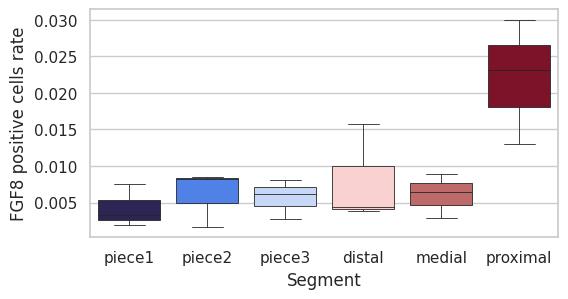

In [30]:
import seaborn as sns

sns.set(rc={'figure.figsize':(6,3)})

sns.set_style("whitegrid")


adataGene = adata.raw.to_adata()[:,"FGF8"]
dummies = pd.get_dummies(adataGene.obs["dataset"])
adataGene.X = mintCountsadata[adataGene.obs_names, adataGene.var_names].X.copy()

countsAbove0 = (adataGene.X.todense().A1 > 0).astype(int)


SegmentCounts = pd.DataFrame(np.dot(countsAbove0, dummies),columns=["FGF8"+"_positive"])
SegmentCounts["dataset"] = dummies.columns.tolist()
SegmentCounts["organoid"] = SegmentCounts["dataset"].str.split("_", expand=True)[0]
SegmentCounts["Segment"] = SegmentCounts["dataset"].str.split("_", expand=True)[1]

SegmentCounts["Total_perOrganoid"] = adataGene.obs.groupby(["organoid"]).size().loc[SegmentCounts.organoid].tolist()
SegmentCounts["Total_perSegment_perOrganoid"] = adataGene.obs.groupby(["dataset"]).size().loc[SegmentCounts.dataset].tolist()
SegmentCounts["FGF8"+"_positive.NormalizedByOrganoid"] = SegmentCounts["FGF8"+"_positive"] / SegmentCounts["Total_perOrganoid"]
SegmentCounts["FGF8"+" positive cells rate"] = SegmentCounts["FGF8"+"_positive"] / SegmentCounts["Total_perSegment_perOrganoid"]



sns.boxplot(data=SegmentCounts, x="Segment", y="FGF8"+" positive cells rate", 
            linewidth=.6,
            palette=dict(zip(SegmentCounts.Segment.unique().tolist(),[colorMap[k]["color"] for k in SegmentCounts.Segment.unique().tolist()])))

SegmentCounts.to_excel("./tables/ExtendedFig6C.xlsx")
plt.show()




# Save UMAP and obs

In [31]:
obsTable = adata.obs
obsTable["UMAP1"] = adata.obsm["X_umap"][:,0].flatten()
obsTable["UMAP2"] = adata.obsm["X_umap"][:,1].flatten()
obsTable.to_excel("./tables/MainFig5E_B.xlsx")